In [2]:
cd ..

/Users/lisawink/Documents/freiburg


In [25]:
import pandas as pd
import calc_params
import geopandas as gpd

In [17]:
from importlib import reload

In [24]:
reload(calc_params)

<module 'calc_params' from '/Users/lisawink/Documents/freiburg/calc_params.py'>

# Meteobikes

Meteobike dara from 29th June 2022

In [4]:
mbike = pd.read_csv('/Users/lisawink/Documents/paper1/data/raw_data/ALL-SYSTEMS-2022-06-29.csv')

In [5]:
bldgs = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_buildings_3D.parquet')
streets = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_streets.parquet')
nodes = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_nodes.parquet')

In [6]:
i = 200
stn_buffers = calc_params.buffer_stations(mbike, radius=200, input_crs='EPSG:4326', output_crs='EPSG:31468', lat_column = 'Latitude', lon_column = 'Longitude')
stn_buffers = calc_params.neighbourhood_graph_params(bldgs, stn_buffers)
b,s,n = calc_params.select_objects(bldgs, streets, nodes, stn_buffers)
stn_buffers = calc_params.aggregate_params(b,s,n, stn_buffers)

skv_path = '/Users/lisawink/Documents/paper1/data/processed_data/SVF.tif'
print(stn_buffers)
stn_buffers = calc_params.agg_raster(skv_path, stn_buffers, 'SVF')
stn_buffers.to_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/processed_station_params_' + str(i) + '.parquet')

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py

ValueError: attempt to get argmax of an empty sequence

In [26]:
stn_buffers = calc_params.aggregate_params(b,s,n, stn_buffers)


/Users/lisawink/Documents/freiburg/calc_params.py:367: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[[i+'_wmean',i+'_wstd',i+'_wmedian',i+'_wmin',i+'_wmax',i+'_wsum',i+'_wmode',i+'_wper25',i+'_wper75']] = selected_buildings.groupby('station_id')[[i,weight]].apply(weighted_stats, i, weight)
/Users/lisawink/Documents/freiburg/calc_params.py:367: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[[i+'_wmean',i+'_wstd',i+'_wmedian',i+'_wmin',i+'_wmax',i+'_wsum',i+'_wmode',i+'_wper25',i+'_wper75']] = selected_buildings.groupby('stat

In [27]:
skv_path = '/Users/lisawink/Documents/paper1/data/processed_data/SVF.tif'
print(stn_buffers)
stn_buffers = calc_params.agg_raster(skv_path, stn_buffers, 'SVF')
stn_buffers.to_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/processed_station_params_' + str(i) + '.parquet')

      System_ID                  Time_UTC  Seconds_in_day  Altitude  \
0             1  2022-06-29T19:32:52.000Z           70371     292.1   
1             1  2022-06-29T19:33:01.000Z           70381     293.6   
2             1  2022-06-29T19:33:07.000Z           70386     294.6   
3             1  2022-06-29T19:33:16.000Z           70396     294.8   
4             1  2022-06-29T19:33:44.000Z           70423     283.2   
...         ...                       ...             ...       ...   
9725         99  2022-06-29T21:32:01.000Z           77521     285.3   
9726         99  2022-06-29T21:32:10.000Z           77529     286.3   
9727         99  2022-06-29T21:32:19.000Z           77539     288.6   
9728         99  2022-06-29T21:32:44.000Z           77564     287.3   
9729         99  2022-06-29T21:32:53.000Z           77573     288.9   

       Latitude  Longitude  Temperature_diff_K  Absolute_temperature_degC  \
0     47.993525   7.845168                0.02                      24

FileNotFoundError: [Errno 2] Failed to open local file '/Users/lisawink/Documents/paper1/data/processed_data/mbike/processed_station_params_200.parquet'. Detail: [errno 2] No such file or directory

In [28]:
stn_buffers.to_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/processed_station_params_' + str(i) + '.parquet')

In [29]:
stn_buffers

,System_ID,Time_UTC,Seconds_in_day,Altitude,Latitude,Longitude,Temperature_diff_K,Absolute_temperature_degC,Relhumidity_diff_percent,Relhumidity_percent,...,StrSCl_MAD,StrSCl_skew,StrSCl_per25,StrSCl_per75,BuCAR,SVF,SVF_mean,SVF_std,SVF_median,SVF_IQR
0,1,2022-06-29T19:32:52.000Z,70371,292.1,47.993525,7.845168,0.02,24.60,8.1,64.2,...,0.038345,0.296830,0.0,0.076923,0.391041,"{'min': 0.009895248338580132, 'max': 1.0, 'mea...",0.631997,0.259620,0.665867,0.423754
1,1,2022-06-29T19:33:01.000Z,70381,293.6,47.993805,7.845362,-0.01,24.50,8.1,64.2,...,0.034856,0.791646,0.0,0.076923,0.388707,"{'min': 0.009895248338580132, 'max': 1.0, 'mea...",0.644738,0.253144,0.682190,0.410638
2,1,2022-06-29T19:33:07.000Z,70386,294.6,47.994033,7.845457,-0.01,24.50,8.1,64.2,...,0.015625,0.848364,0.0,0.076923,0.380502,"{'min': 0.009895248338580132, 'max': 1.0, 'mea...",0.645806,0.252715,0.687340,0.411066
3,1,2022-06-29T19:33:16.000Z,70396,294.8,47.994367,7.845562,-0.01,24.50,8.0,64.2,...,0.000000,0.527021,0.0,0.071795,0.407643,"{'min': 0.009895248338580132, 'max': 1.0, 'mea...",0.651616,0.249002,0.697683,0.405167
4,1,2022-06-29T19:33:44.000Z,70423,283.2,47.995337,7.845955,-0.01,24.50,8.0,64.2,...,0.000000,0.916421,0.0,0.043478,0.473701,"{'min': 0.005841491743922234, 'max': 1.0, 'mea...",0.670380,0.243410,0.725945,0.389733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9725,99,2022-06-29T21:32:01.000Z,77521,285.3,47.992468,7.848665,0.76,21.62,2.3,73.4,...,0.000000,0.854451,0.0,0.071429,0.485506,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.607921,0.263814,0.624914,0.440159
9726,99,2022-06-29T21:32:10.000Z,77529,286.3,47.992602,7.848607,0.76,21.62,2.4,73.4,...,0.000000,0.993033,0.0,0.065126,0.487488,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.610998,0.263742,0.631460,0.438395
9727,99,2022-06-29T21:32:19.000Z,77539,288.6,47.992720,7.847900,0.76,21.62,2.4,73.4,...,0.000000,0.854451,0.0,0.071429,0.461838,"{'min': 0.010926200076937675, 'max': 1.0, 'mea...",0.610178,0.258706,0.637670,0.416844
9728,99,2022-06-29T21:32:44.000Z,77564,287.3,47.993572,7.845558,0.66,21.52,2.5,73.6,...,0.000000,0.858686,0.0,0.076923,0.412648,"{'min': 0.009895248338580132, 'max': 1.0, 'mea...",0.640871,0.255429,0.674708,0.417419


<Axes: xlabel='BuCAR', ylabel='Absolute_temperature_degC'>

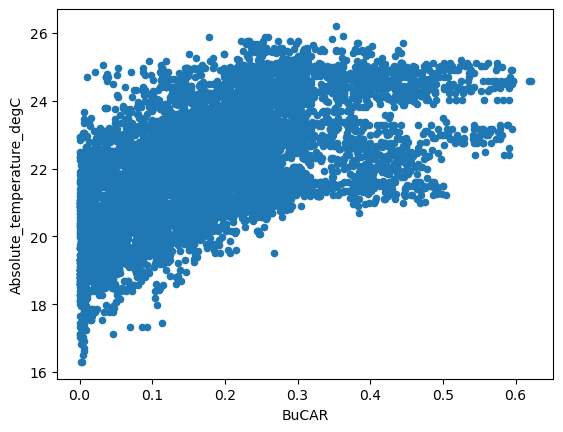

In [32]:
stn_buffers[['BuCAR','Absolute_temperature_degC']].plot(x='BuCAR', y='Absolute_temperature_degC', kind='scatter')